In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch
from torch.utils.data import DataLoader
import time

import sys
sys.path.append("../")

LOAD_STATE = True

from utils.prep_utils import (
    COLORMAP,
    heatmaps_to_coordinates,
    N_KEYPOINTS,
    RAW_IMG_SIZE,
    MODEL_IMG_SIZE,
    show_batch_predictions,
    DATASET_MEANS,
    DATASET_STDS,
    get_norm_params,
    import_object_from_file,
    IoULoss
    
)
from utils.model import ShallowUNet
from utils.dataset import FreiHAND, HanCo

### Inference Parametes

In [3]:
##### # config = {
#     "data_dir": "/scratch/palle.a/AirKeyboard/data/freihand_all/FreiHAND_pub_v2",
#     "model_path": "/scratch/palle.a/AirKeyboard/python_sample/weights/model_final",
#     "test_batch_size": 4,
#     "device": "cuda",
# }


cfg_file_path = "/scratch/palle.a/AirKeyboard/python_sample/notebooks/training_configs/hanco_mid_l6.py"


model = import_object_from_file(cfg_file_path, "model")
config = import_object_from_file(cfg_file_path, "config")


config["n_samples"] = 60000

# config = {
#     "data_dir": "/scratch/palle.a/AirKeyboard/data/hanco_all/HanCo",
#     "save_loc": "/scratch/palle.a/AirKeyboard/python_sample/weights/model_final",
#     "test_batch_size": 4,
#     "batch_size" : 4,
#     "device": "cuda",
#     "n_samples" : 10000,
# }

## Data

In [4]:
# test_dataset = FreiHAND(config=config, set_type="test")
# test_dataloader = DataLoader(
#     test_dataset,
#     config["test_batch_size"],
#     shuffle=True,
#     drop_last=False,
#     num_workers=2,
# )

test_dataset = HanCo(config=config, set_type="test")

print(len(test_dataset))
test_dataloader = DataLoader(
    test_dataset, config["batch_size"], shuffle=False, drop_last=True, num_workers=2
)
    


100%|██████████| 2000/2000 [00:10<00:00, 197.20it/s]
2000it [00:00, 5552.37it/s]

2000


## Model

In [5]:
#model = ShallowUNet(3, 21)
save_loc = config["save_loc"]

if not LOAD_STATE:
    state_dict = torch.load(save_loc, map_location=torch.device(config["device"]))

else:
    checkpoint = torch.load(save_loc, map_location=torch.device(config["device"]))
    # Load model, optimizer, and scheduler states
    state_dict = checkpoint['model_state_dict']
    
model.load_state_dict(state_dict)
    
    
    
example =  torch.rand(1,3,128,128)
# trace_model = torch.jit.trace(model,example)
# trace_model.save(config["model_path"]+".pt")
# model = trace_model


def print_computation_graph_and_params(model, input_tensor):
    # Print computation graph
#     print("Computation Graph:")
#     trace, _ = torch.jit.get_trace_graph(model, input_tensor)
#     print(trace)

    # Print model parameters
    print("Model Parameters:")
    i = 0
    for name, param in model.named_parameters():
        print(f"{name}:\n{param.data}")
        i += 1
        if i > 3:
            break

        
#print_computation_graph_and_params(model, example)
model.eval()
print("Model loaded")

Model loaded


## Evaluate on Test Data

In [6]:
accuracy_all = []
loss_all = []
cpu_runtimes = []
gpu_runtimes = []
loss_fn = IoULoss()
cpu_device = torch.device("cpu")
gpu_device = torch.device("cuda")
print(next(model.parameters()).device)

model.to(gpu_device)
for data in tqdm(test_dataloader):
    inputs = data["image"]
    test_hm  = data["heatmaps"]
    
    inputs = inputs.to(gpu_device)
    test_hm = test_hm.to(gpu_device)
    
    pred_heatmaps = model(inputs)
    
    
    loss = loss_fn(pred_heatmaps, test_hm)
    loss_all.append(loss.item())
    
    pred_heatmaps = pred_heatmaps.cpu().detach().numpy()
    true_keypoints = data["keypoints"].numpy()
    pred_keypoints = heatmaps_to_coordinates(pred_heatmaps)

    accuracy_keypoint = ((true_keypoints - pred_keypoints) ** 2).sum(axis=2) ** (1 / 2)
    accuracy_image = accuracy_keypoint.mean(axis=1)
    
    accuracy_all.extend(list(accuracy_image))
    
    for inp in inputs:
        model.to(cpu_device)
        inp = inp.to(cpu_device)
        start = time.time()
        model(inp.unsqueeze(0))
        end = time.time()
        cpu_runtimes.append(end-start)
        
        model.to(gpu_device)
        inp = inp.to(gpu_device)
        start = time.time()
        model(inp.unsqueeze(0))
        end = time.time()
        gpu_runtimes.append(end-start)

    

  0%|          | 0/31 [00:00<?, ?it/s]

cpu


100%|██████████| 31/31 [07:08<00:00, 13.81s/it]


In [7]:
loss = np.mean(loss_all)
error = np.mean(accuracy_all)
cpu_runtime = np.mean(cpu_runtimes)
gpu_runtime = np.mean(gpu_runtimes)

print(f"Average Loss on Test: {loss}, IOU: {1-loss}")

print(f"Average CPU runtime on test(seconds): {cpu_runtime}" )
print(f"Average GPU runtime on test(seconds): {gpu_runtime}" )

print("Average error per keypoint: {:.1f}% from image size".format(error * 100))

for img_size in [MODEL_IMG_SIZE, RAW_IMG_SIZE]:
    error_pixels = error * img_size
    image_size = f"{img_size}x{img_size}"
    print(
        "Average error per keypoint: {:.0f} pixels for image {}".format(
            error_pixels, image_size
        )
    )

Average Loss on Test: 0.20772553451599612, IOU: 0.7922744654840039
Average CPU runtime on test(seconds): 0.09403300249288159
Average GPU runtime on test(seconds): 0.004310629060191493
Average error per keypoint: 2.2% from image size
Average error per keypoint: 3 pixels for image 128x128
Average error per keypoint: 5 pixels for image 224x224


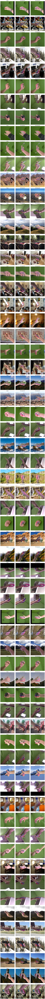

In [8]:

model.to(cpu_device)
for data in test_dataloader:
    show_batch_predictions(data, model)
    break